# I. Problem Statement
Tasked with building a credit scoring model for a financial company, "Prêt à dépenser," which offers consumer credit to individuals with minimal or no loan history. The goal is to develop a classification algorithm that predicts the probability of a customer repaying their loan, subsequently classifying the application as either approved or refused credit. The model will utilize various data sources, including behavioral data and information from other financial institutions.

## Datasets Description
### application_train.csv & application_test.csv
These files contain static data for all loan applications. The train set includes a TARGET column indicating loan repayment status.

### bureau.csv
This file includes the client's previous credits provided by other financial institutions, reported to the Credit Bureau. Each loan in our sample may have multiple rows corresponding to different credits.

### bureau_balance.csv
This file contains monthly balances of previous credits reported to the Credit Bureau, with each row representing a month of history for each previous credit.

### POS_CASH_balance.csv
Monthly balance snapshots of previous POS (point of sales) and cash loans with Home Credit. Each row represents a month of history for each previous credit.

### credit_card_balance.csv
Monthly balance snapshots of previous credit cards with Home Credit. Each row represents a month of history for each previous credit card.

### previous_application.csv
This file includes all previous applications for Home Credit loans of clients who have loans in our sample.

### installments_payments.csv
Repayment history for previously disbursed credits with Home Credit, with one row per payment or missed payment.

### HomeCredit_columns_description.csv
This file contains descriptions for the columns in the various data files.

# II. Approach:

To address the problem, we follow a structured approach that involves several key steps, each aimed at ensuring the model is both accurate and interpretable. Here's an overview of the approach:

### 1. Data Understanding and Import

- Starting by understanding the datasets provided, including their structure, relationships, and the type of information they contain.
- Importing all necessary datasets and libraries required for data processing and model building.

### 2. Data Preprocessing and Aggregation

- Aggregating numeric and categorical features from various datasets related to the main application data. This involves summarizing relevant information to a single level (e.g., applicant level) for easier analysis and modeling.
- Merging these aggregated features back into the main application datasets to create a comprehensive dataset for each applicant.

### 3. Feature Engineering

- Creating new features based on domain knowledge to enhance the predictive power of the model. These features include ratios and percentages that intuitively make sense in the context of credit scoring.
- Handling missing values appropriately to ensure the dataset is clean and ready for modeling.

### 4. Imputation and Encoding

- Imputing missing values using statistical methods to avoid data loss.
- Converting categorical features into numerical values using one-hot encoding to make them compatible with machine learning algorithms.

### 5. Feature Selection

- Using a powerful algorithm like LightGBM to identify and select the most important features, reducing dimensionality and improving model performance.

### 6. Model Training and Evaluation

- Training multiple machine learning models to identify the best-performing one. Evaluate these models based on accuracy, precision, recall, F1 score, and other relevant metrics.
- Addressing class imbalance using techniques like SMOTE to ensure the model is not biased towards the majority class.

### 7. Model Selection and Prediction

- Selecting the best model based on evaluation metrics and use it to make predictions on the test set.
- Saving the final predictions in the required format for submission.

### 8. Feature Importance Analysis

- Analyzing the importance of features used in the model to understand which factors are most influential in predicting loan repayment.
- Visualizing feature importance and evaluate the model's performance using ROC curves and AUC scores.

By following this approach, we aim to build a robust and interpretable credit scoring model that can accurately predict the likelihood of a customer repaying their loan, thereby aiding the financial company in making informed credit decisions.

# III. Data Preprocessing
### Importing necessary libraries and datasets:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder

In [2]:
application_train = pd.read_csv('application_train.csv')
application_test = pd.read_csv('application_test.csv')
bureau = pd.read_csv('bureau.csv')

In [3]:
credit_card_balance = pd.read_csv('credit_card_balance.csv')
installments_payments = pd.read_csv('installments_payments.csv')
POS_CASH_balance = pd.read_csv('POS_CASH_balance.csv')
previous_application = pd.read_csv('previous_application.csv')

In [4]:
bureau_balance = pd.read_csv('bureau_balance.csv')

### Defining functions to aggregate numeric and categorical features
The agg_numeric function aggregates numeric features by calculating the count, mean, max, min, and sum for each group, while the count_categorical function counts occurrences of each category and normalizes them by the group.

In [5]:
def agg_numeric(df, group_var, df_name):
    
    numeric_df = df.select_dtypes(include=[np.number])
    if group_var in df.columns and group_var not in numeric_df.columns:
        numeric_df[group_var] = df[group_var]

    for col in numeric_df:
        if col != group_var and 'SK_ID' in col:
            numeric_df = numeric_df.drop(columns=col)
    
    # Grouping by the specified variable and calculate the statistics
    agg = numeric_df.groupby(group_var).agg(['count', 'mean', 'max', 'min', 'sum']).reset_index()

    # Creating new column names
    columns = [group_var]
    for var in agg.columns.levels[0]:
        if var != group_var:
            for stat in agg.columns.levels[1][:-1]:
                columns.append(f'{df_name}_{var}_{stat}')
    agg.columns = columns
    return agg


def count_categorical(df, group_var, df_name):
    categorical = pd.get_dummies(df.select_dtypes('object'))
    categorical[group_var] = df[group_var]
    categorical = categorical.groupby(group_var).agg(['sum', 'mean'])
    column_names = ['%s_%s_%s' % (df_name, var, stat) for var in categorical.columns.levels[0] for stat in ['count', 'count_norm']]
    categorical.columns = column_names
    return categorical

### Merging bureau_balance with bureau to include SK_ID_CURR in bureau_balance
This step ensures that we have a common identifier (SK_ID_CURR) for merging the bureau_balance data with the main application data.

In [6]:
# Merging bureau_balance with bureau to get SK_ID_CURR in bureau_balance
bureau_balance_merged = bureau_balance.merge(bureau[['SK_ID_BUREAU', 'SK_ID_CURR']], on='SK_ID_BUREAU', how='left')

### Aggregation and merging for each dataset
The aggregate_and_merge function aggregates both numeric and categorical features of secondary datasets and merges them with the main application data (application_train and application_test).

In [7]:
# Aggregation and merging for each dataset
def aggregate_and_merge(main_df, secondary_df, group_var, df_name):
    agg_numeric_df = agg_numeric(secondary_df, group_var, df_name)
    # Adjusting for categorical data if applicable
    agg_categorical_df = count_categorical(secondary_df, group_var, df_name) if 'object' in secondary_df.dtypes.values else pd.DataFrame()
    main_df = main_df.merge(agg_numeric_df, on=group_var, how='left')
    if not agg_categorical_df.empty:
        main_df = main_df.merge(agg_categorical_df, on=group_var, how='left')
    return main_df

# Applying aggregation and merging for bureau and bureau_balance datasets
application_train = aggregate_and_merge(application_train, bureau, 'SK_ID_CURR', 'bureau')
application_train = aggregate_and_merge(application_train, bureau_balance_merged, 'SK_ID_CURR', 'bureau_balance')
application_test = aggregate_and_merge(application_test, bureau, 'SK_ID_CURR', 'bureau')
application_test = aggregate_and_merge(application_test, bureau_balance_merged, 'SK_ID_CURR', 'bureau_balance')


# Repeating the process for other datasets: credit_card_balance, installments_payments, POS_CASH_balance, previous_application
datasets = [
    (credit_card_balance, 'SK_ID_CURR', 'credit_card'),
    (installments_payments, 'SK_ID_CURR', 'installments'),
    (POS_CASH_balance, 'SK_ID_CURR', 'pos_cash'),
    (previous_application, 'SK_ID_CURR', 'previous_app')
]

for dataset, id_var, dataset_name in datasets:
    application_train = aggregate_and_merge(application_train, dataset, id_var, dataset_name)
    application_test = aggregate_and_merge(application_test, dataset, id_var, dataset_name)

## Initial Structure of the Data

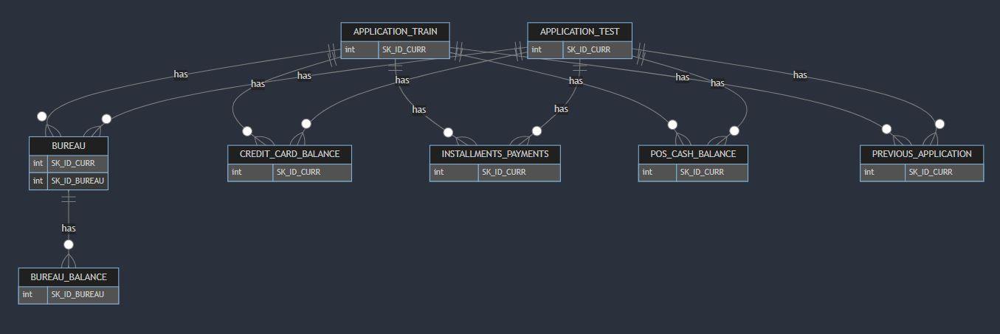

## Merging bureau_balance with bureau

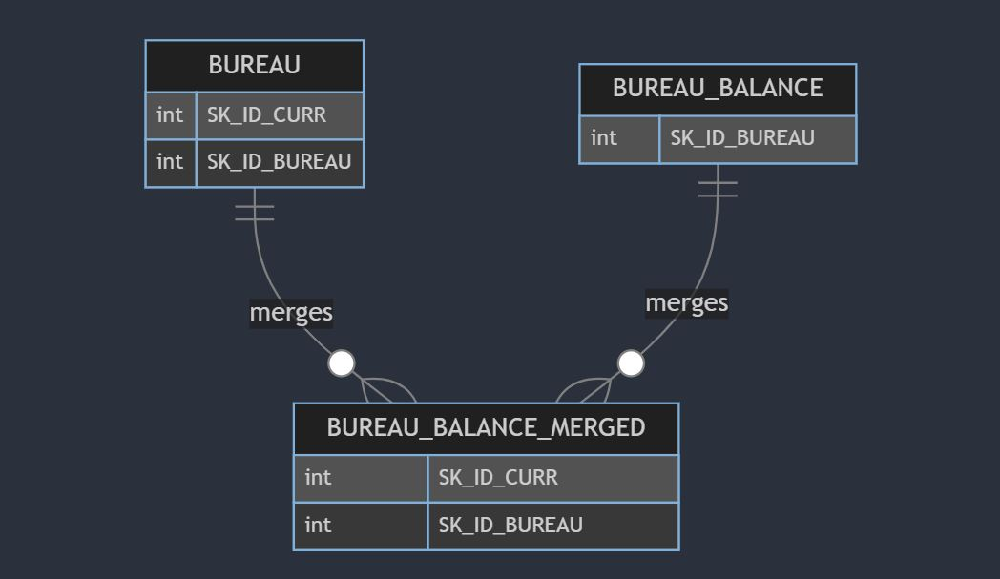

## Aggregation and Merging

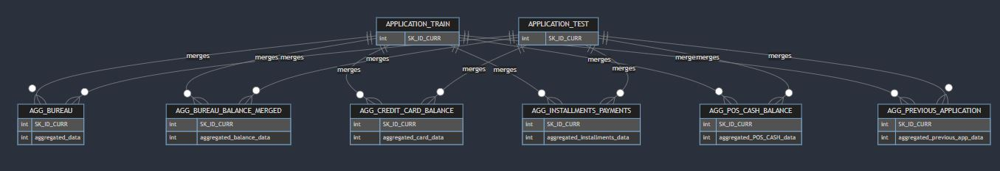

## Final Merged Data Structure

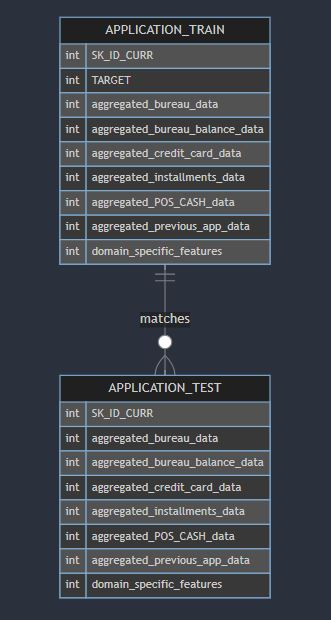

# IV. Feature Engineering

## Adding Domain-Specific Features

In this step, we create new features from existing columns to provide more meaningful insights and potentially improve the performance of our machine learning models. The following domain-specific features are added:

1. **Credit to Income Ratio (`CREDIT_INCOME_PERCENT`)**:
   - This feature represents the ratio of the credit amount to the total income of the applicant.
   - It helps us understand how much credit the applicant has taken compared to their income, providing insights into their financial leverage.

2. **Annuity to Income Ratio (`ANNUITY_INCOME_PERCENT`)**:
   - This feature calculates the ratio of the loan repayment amount (annuity) to the total income of the applicant.
   - It shows the burden of loan repayment on the applicant's income, which is important for assessing their ability to repay the loan.

3. **Credit Term (`CREDIT_TERM`)**:
   - This feature is the ratio of the annuity to the credit amount, representing the duration or term of the credit.
   - It provides information on how long the applicant will take to repay the loan, which is important for risk assessment.

4. **Days Employed Percentage (`DAYS_EMPLOYED_PERCENT`)**:
   - This feature calculates the ratio of the number of days the applicant has been employed to their age in days (`DAYS_BIRTH`).
   - It indicates the applicant's employment stability and experience relative to their age, which is an important factor in loan repayment capacity.

By adding these domain-specific features, we aim to capture more detailed relationships within the data that might not be obvious from the raw features alone. These derived features can enhance the model's ability to predict the likelihood of loan repayment more accurately.

In [8]:
# Adding Domain Knowledge Features
def add_domain_features(df):
    # Credit to income ratio
    df['CREDIT_INCOME_PERCENT'] = df['AMT_CREDIT'] / df['AMT_INCOME_TOTAL']
    
    # Annuity to income ratio
    df['ANNUITY_INCOME_PERCENT'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    
    # Credit term
    df['CREDIT_TERM'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    
    # Days employed percentage in his life
    df['DAYS_EMPLOYED_PERCENT'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    
    return df

# Applying the function to both train and test datasets
application_train = add_domain_features(application_train)
application_test = add_domain_features(application_test)

## Handling Missing Values

In this step, we deal with missing data in our datasets. Missing values can cause problems in our analysis and models, so we need to address them. Here's what we did:

1. **Calculate Missing Values**:
   - We checked each column to see how many values were missing and calculated the percentage of missing data for each column.

2. **Set a Threshold for Missing Data**:
   - We decided that if a column has more than 80% of its values missing, it's not useful for our analysis. 
   - This threshold helps us keep important data while getting rid of columns that don't provide much information.

3. **Remove Columns with Too Much Missing Data**:
   - We identified the columns that had more than 80% missing data.
   - These columns were removed from both the training and testing datasets to improve the quality of our data.

By doing this, we ensure that our models are trained on more complete and reliable data, leading to better predictions.

In [9]:
# Function to calculate missing values by column
def missing_values_table(df, percentage=80):
    mis_val = df.isnull().sum()
    mis_val_percent = 100 * mis_val / len(df)
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    mis_val_table_ren_columns = mis_val_table.rename(columns={0: 'Missing Values', 1: '% of Total Values'})
    mis_val_table_ren_columns = mis_val_table_ren_columns[mis_val_table_ren_columns.iloc[:, 1] >= percentage].sort_values('% of Total Values', ascending=False)
    return mis_val_table_ren_columns

# Checking for missing data above 80% threshold
missing_train = missing_values_table(application_train)
missing_test = missing_values_table(application_test)

# Dropping columns with more than 80% missing in either dataset
missing_columns = list(set(missing_train.index) | set(missing_test.index))
application_train.drop(columns=missing_columns, inplace=True)
application_test.drop(columns=missing_columns, inplace=True)

In [10]:
application_train.shape

(207511, 794)

# V. Imputation and Encoding

## Impute Missing Values

We need to handle missing values in our datasets to ensure our models can be trained effectively without running into errors. Here's what we did:

1. **Impute Missing Values**:
   - We used `SimpleImputer` with the median strategy to fill missing numeric values. 
   - This replaces missing values with the median of the respective columns, which is a good practice to handle missing data without introducing outliers.

2. **Align Training and Testing Data**:
   - We aligned the training and testing data to make sure they have the same features.
   - This ensures consistency between the training and testing datasets, which is crucial for accurate model predictions.

3. **Reapply Imputation**:
   - After aligning, we fit the imputer again on the training data (excluding the TARGET column) and transformed both the training and testing datasets.
   - This step ensures that all numeric missing values are properly filled in both datasets.

By imputing missing values, we make our datasets complete and ready for model training.

In [11]:
imputer = SimpleImputer(strategy='median')
# Save the TARGET column
train_labels = application_train['TARGET'].copy()
train_features = application_train.drop(['TARGET'], axis=1)
train_numeric = train_features.select_dtypes(include=[np.number])
application_train[train_numeric.columns] = imputer.fit_transform(train_numeric)

# Align the training and test dataframes to ensure they have the same features
application_train, application_test = application_train.align(application_test, join='inner', axis=1)

# Now, fit the imputer on the training set without the TARGET column and transform both sets
train_numeric = application_train.select_dtypes(include=[np.number])
application_train[train_numeric.columns] = imputer.fit_transform(train_numeric)

test_numeric = application_test.select_dtypes(include=[np.number])
application_test[test_numeric.columns] = imputer.transform(test_numeric)

In [12]:
application_train['TARGET'] = train_labels.values

In [13]:
print(f"Training data shape: {application_train.shape}")
print(f"Testing data shape: {application_test.shape}")

Training data shape: (207511, 794)
Testing data shape: (100000, 793)


## One-Hot Encode Categorical Features

Machine learning models require numerical input, so we need to convert categorical features into numeric format. Here's how we did it:

1. **One-Hot Encoding**:
   - We used one-hot encoding to convert categorical features into numerical format. This creates new columns for each category, with binary values indicating the presence of each category.
   
2. **Consistent Column Names**:
   - We cleaned the column names by replacing any non-alphanumeric characters with underscores. This prevents issues that might arise from special characters in column names.

One-hot encoding helps in transforming categorical data into a format that machine learning models can interpret, leading to better model performance.

By performing these steps, we ensure that our data is well-prepared for building and training machine learning models.

In [14]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [15]:
application_train.dtypes

SK_ID_CURR                                                                             float64
NAME_CONTRACT_TYPE                                                                      object
CODE_GENDER                                                                             object
FLAG_OWN_CAR                                                                            object
FLAG_OWN_REALTY                                                                         object
CNT_CHILDREN                                                                           float64
AMT_INCOME_TOTAL                                                                       float64
AMT_CREDIT                                                                             float64
AMT_ANNUITY                                                                            float64
AMT_GOODS_PRICE                                                                        float64
NAME_TYPE_SUITE                                   

In [16]:
application_train = pd.get_dummies(application_train)
application_test = pd.get_dummies(application_test)

In [19]:
application_train.columns = ["".join (c if c.isalnum() else "_" for c in str(x)) for x in application_train.columns]
application_test.columns = ["".join (c if c.isalnum() else "_" for c in str(x)) for x in application_test.columns]

# VI. Feature Selection

In this step, we use LightGBM to identify and select the most important features from our dataset. Here's what we did:

1. **Prepare the Datasets for Training**:
   - We split the dataset into features (`X`) and target (`y`), excluding the `SK_ID_CURR` and `TARGET` columns.
   - We further split the data into training and validation sets to evaluate the model's performance.

2. **Train the LightGBM Model**:
   - We initialized a LightGBM classifier (`LGBMClassifier`) with specific hyperparameters:
     - `n_estimators`: Number of boosting rounds.
     - `learning_rate`: Step size for each iteration.
     - `num_leaves`: Maximum number of leaves in one tree.
     - `colsample_bytree`: Fraction of features used for each tree.
     - `subsample`: Fraction of samples used for each tree.
     - `max_depth`: Maximum depth of each tree.
     - `reg_alpha` and `reg_lambda`: Regularization parameters.
     - `min_split_gain` and `min_child_weight`: Parameters to control overfitting.
   - We trained the model on the training set and evaluated it on the validation set using the F1 score as the evaluation metric.

3. **Determine Feature Importances**:
   - After training, we extracted the importance scores for each feature.
   - We calculated the mean importance score to set a dynamic threshold.

4. **Select Important Features**:
   - We identified features with importance scores higher than the mean threshold.
   - These selected features are considered important for predicting the target variable.

5. **Reduce the Training and Test Sets**:
   - We reduced the training, validation, and test sets to only include the selected important features.
   - This reduction helps in improving the model's performance by focusing on the most relevant features.

By performing feature selection, we streamline our dataset to only include features that contribute significantly to the model's predictions. This step enhances the efficiency and accuracy of our machine learning models.

In [20]:
from lightgbm import LGBMClassifier
from sklearn.model_selection import train_test_split

# Prepare the datasets for training
X = application_train.drop(['SK_ID_CURR', 'TARGET'], axis=1)
y = application_train['TARGET']

In [21]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=34,
    colsample_bytree=0.9,
    subsample=0.8,
    max_depth=8,
    reg_alpha=0.04,
    reg_lambda=0.07,
    min_split_gain=0.02,
    min_child_weight=40,
    silent=-1,
    verbose=-1
)

lgbm.fit(
    X_train, 
    y_train, 
    eval_set=[(X_valid, y_valid)], 
    eval_metric='f1'
)

# Feature importances
feature_importances = pd.DataFrame({'feature': X.columns, 'importance': lgbm.feature_importances_})

In [22]:
# Dynamic threshold based on the mean importance
threshold = feature_importances['importance'].mean()

# Features to keep
features_to_keep = feature_importances[feature_importances['importance'] > threshold]['feature'].tolist()

# Reduce the training and test sets
X_train_reduced = X_train[features_to_keep]
X_valid_reduced = X_valid[features_to_keep]
X_test_reduced = application_test[features_to_keep]

print(f"Training set reduced to {X_train_reduced.shape[1]} features.")


Training set reduced to 260 features.


#### Successfully reduced the number of features to 260, focusing on the most important ones. This streamlined feature set will help in building more efficient and accurate models.

# VII. Model Training and Evaluation

## Applying SMOTE for Class Imbalance

To address class imbalance in our dataset, we use SMOTE (Synthetic Minority Over-sampling Technique). SMOTE generates synthetic samples for the minority class to balance the dataset, improving the model's ability to learn from underrepresented classes.

1. **Split the Data**:
   - We split the reduced training data into training and validation sets.
   - This split allows us to evaluate the model's performance on unseen data.

2. **Apply SMOTE**:
   - We apply SMOTE to the training set to generate synthetic samples for the minority class.
   - This results in a balanced training set, which helps in training more robust models.

In [24]:
from imblearn.over_sampling import SMOTE

X_train_split, X_valid_split, y_train_split, y_valid_split = train_test_split(X_train_reduced, y_train, test_size=0.3, random_state=42)

# Applying SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_split, y_train_split)

## Training and Evaluating Various Machine Learning Models

We train multiple machine learning models and evaluate their performance based on accuracy, precision, recall, F1 score, and time taken. Here are the steps:

1. **Model Definitions**:
   - We define a list of models to be trained, including Logistic Regression, K-Nearest Neighbors (KNN), Decision Tree, Random Forest, AdaBoost, Naive Bayes, and XGBoost.

2. **Scale the Data (if needed)**:
   - For models that require feature scaling, we use `StandardScaler` to scale the training and validation data.
   - This step ensures that features are on a similar scale, which can improve the performance of certain models.

3. **Train and Evaluate Models**:
   - We train each model on the SMOTE-applied training data and make predictions on both the training and validation sets.
   - We calculate performance metrics including accuracy, precision, recall, F1 score, and the time taken for training and prediction.
   - We save each trained model using `joblib` for future use.

4. **Store and Display Results**:
   - We store the results in a DataFrame and sort them by the F1 score in descending order.
   - This helps in identifying the best-performing model based on the F1 score.

By training and evaluating multiple models, we can compare their performance and select the best model for our task. This approach ensures that we choose a model that not only performs well on the training data but also generalizes effectively to unseen data.

In [26]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
import pandas as pd
import time
import joblib

In [27]:
# Models definition
models = [
    ("Logistic Regression", LogisticRegression(max_iter=1000), True),
    ("KNN", KNeighborsClassifier(), True),
    ("Decision Tree", DecisionTreeClassifier(), False),
    ("Random Forest", RandomForestClassifier(), False),
    ("AdaBoost", AdaBoostClassifier(), False),
    ("Naive Bayes", GaussianNB(), True),
    ("XGBoost", XGBClassifier(use_label_encoder=False, eval_metric='logloss'), False)
]

results_list = []
scaler = StandardScaler()

# Fitting and transforming with scaler (if needed)
if any(model[2] for model in models):
    X_train_scaled = scaler.fit_transform(X_train_smote)
    X_valid_scaled = scaler.transform(X_valid_split)
else:
    X_train_scaled, X_valid_scaled = X_train_smote, X_valid_split

for name, model, needs_scaling in models:
    start_time = time.time()
    
    model.fit(X_train_scaled if needs_scaling else X_train_smote, y_train_smote)
    y_pred_train = model.predict(X_train_scaled if needs_scaling else X_train_smote)
    y_pred_valid = model.predict(X_valid_scaled if needs_scaling else X_valid_split)
    
    train_accuracy = accuracy_score(y_train_smote, y_pred_train)
    valid_accuracy = accuracy_score(y_valid_split, y_pred_valid)
    precision, recall, f1, _ = precision_recall_fscore_support(y_valid_split, y_pred_valid, average='weighted')
    time_taken = time.time() - start_time
    
    # Saving each model
    joblib.dump(model, f"{name.replace(' ', '_')}.joblib")
    
    results_list.append({
        "Model": name,
        "Accuracy_Train": train_accuracy,
        "Accuracy_Valid": valid_accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1_Score": f1,
        "Time_Taken": time_taken
    })

results_df = pd.DataFrame(results_list)
results_df.sort_values(by="F1_Score", ascending=False, inplace=True)
results_df.reset_index(drop=True, inplace=True)

print(results_df)

                 Model  Accuracy_Train  Accuracy_Valid  Precision    Recall  \
0              XGBoost        0.964263        0.918178   0.884116  0.918178   
1        Random Forest        1.000000        0.917535   0.869729  0.917535   
2             AdaBoost        0.911601        0.870048   0.868778  0.870048   
3        Decision Tree        1.000000        0.823063   0.863029  0.823063   
4  Logistic Regression        0.758126        0.731241   0.889706  0.731241   
5                  KNN        0.786856        0.469851   0.878796  0.469851   
6          Naive Bayes        0.571165        0.272112   0.878340  0.272112   

   F1_Score  Time_Taken  
0  0.890273   35.157527  
1  0.883990  831.171360  
2  0.869411  521.820405  
3  0.841678  149.449488  
4  0.789754   92.723091  
5  0.574987  703.883830  
6  0.343239    2.379509  


Here is the summary of the results:

In [32]:
X_test_reduced.shape

(100000, 260)

In [33]:
results_df

,Model,Accuracy_Train,Accuracy_Valid,Precision,Recall,F1_Score,Time_Taken
0,XGBoost,0.964263,0.918178,0.884116,0.918178,0.890273,35.157527
1,Random Forest,1.000000,0.917535,0.869729,0.917535,0.883990,831.171360
2,AdaBoost,0.911601,0.870048,0.868778,0.870048,0.869411,521.820405
3,Decision Tree,1.000000,0.823063,0.863029,0.823063,0.841678,149.449488
4,Logistic Regression,0.758126,0.731241,0.889706,0.731241,0.789754,92.723091
5,KNN,0.786856,0.469851,0.878796,0.469851,0.574987,703.883830
6,Naive Bayes,0.571165,0.272112,0.878340,0.272112,0.343239,2.379509


## Model Evaluation Results

After training and evaluating various machine learning models, here are the performance results:

| Model               | Accuracy_Train | Accuracy_Valid | Precision | Recall   | F1_Score | Time_Taken  |
|---------------------|----------------|----------------|-----------|----------|----------|-------------|
| XGBoost             | 0.964263       | 0.918178       | 0.884116  | 0.918178 | 0.890273 | 35.157527   |
| Random Forest       | 1.000000       | 0.917535       | 0.869729  | 0.917535 | 0.883990 | 831.171360  |
| AdaBoost            | 0.911601       | 0.870048       | 0.868778  | 0.870048 | 0.869411 | 521.820405  |
| Decision Tree       | 1.000000       | 0.823063       | 0.863029  | 0.823063 | 0.841678 | 149.449488  |
| Logistic Regression | 0.758126       | 0.731241       | 0.889706  | 0.731241 | 0.789754 | 92.723091   |
| KNN                 | 0.786856       | 0.469851       | 0.878796  | 0.469851 | 0.574987 | 703.883830  |
| Naive Bayes         | 0.571165       | 0.272112       | 0.878340  | 0.272112 | 0.343239 | 2.379509    |

## Selecting XGBoost as the Best Model

Based on the F1 score, XGBoost is chosen as the best model for predicting loan repayment probabilities. Here are the reasons for selecting XGBoost:

- **Highest F1 Score**: XGBoost achieved the highest F1 score (0.890273) among all the models, indicating a good balance between precision and recall.
- **High Accuracy**: It also has high training and validation accuracy, ensuring that the model generalizes well to new data.
- **Reasonable Time Taken**: The time taken to train XGBoost is significantly lower than Random Forest and KNN, making it a more efficient choice.

# VIII. Best Model Selection and Predictions
## Selecting XGBoost as the best model and predict on the test set
Based on the F1 score, XGBoost is chosen as the best model. Use it to predict the loan repayment probabilities on the test set.

In [34]:
xgb_model = joblib.load("XGBoost.joblib")

# Predicting using the loaded model
y_test_pred = xgb_model.predict(X_test_reduced)

# Creating a submission DataFrame
submission_df = pd.DataFrame({
    "SK_ID_CURR": application_test['SK_ID_CURR'],  
    "TARGET": y_test_pred
})

In [35]:
submission_df

,SK_ID_CURR,TARGET
0,100002.0,0
1,100003.0,0
2,100004.0,0
3,100006.0,0
4,100007.0,0
5,100008.0,0
6,100009.0,0
7,100010.0,0
8,100011.0,0
9,100012.0,0


In [40]:
submission_df.to_csv('Submission_89_v2', index= False)

# IX. Feature Importance Analysis
Training the XGBoost model to identify the top features that contribute to the predictions.

In [45]:
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb_model.fit(X_train_smote, y_train_smote)

# Getting feature importances
feature_importances_xgb = xgb_model.feature_importances_

# Preparing DataFrame to display feature importances for XGBoost
features_xgb_df = pd.DataFrame({
    'Feature': X_train_smote.columns,  # Ensure this matches the DataFrame used for training
    'Importance': feature_importances_xgb
}).sort_values(by='Importance', ascending=False)

# Displaying the top 15 most important features
print(features_xgb_df.head(15))

                                               Feature  Importance
257                                     FLAG_OWN_CAR_N    0.051406
32                            OBS_30_CNT_SOCIAL_CIRCLE    0.044371
9                                          OWN_CAR_AGE    0.043664
10                                     FLAG_WORK_PHONE    0.038785
78                bureau_CREDIT_TYPE_Credit_card_count    0.031084
237  previous_app_NAME_SELLER_INDUSTRY_Consumer_ele...    0.030697
11                         REGION_RATING_CLIENT_W_CITY    0.028338
25                                  NONLIVINGAREA_MODE    0.027581
239      previous_app_NAME_YIELD_GROUP_high_count_norm    0.023205
106            installments_NUM_INSTALMENT_VERSION_max    0.021750
219       previous_app_NAME_CLIENT_TYPE_New_count_norm    0.021540
15                                        EXT_SOURCE_2    0.019042
230  previous_app_NAME_PRODUCT_TYPE_walk_in_count_norm    0.018455
50                 bureau_AMT_CREDIT_MAX_OVERDUE_count    0.01

## Visualizing the top 15 most important features
Plotting a bar chart of the top 15 most important features identified by the XGBoost model.

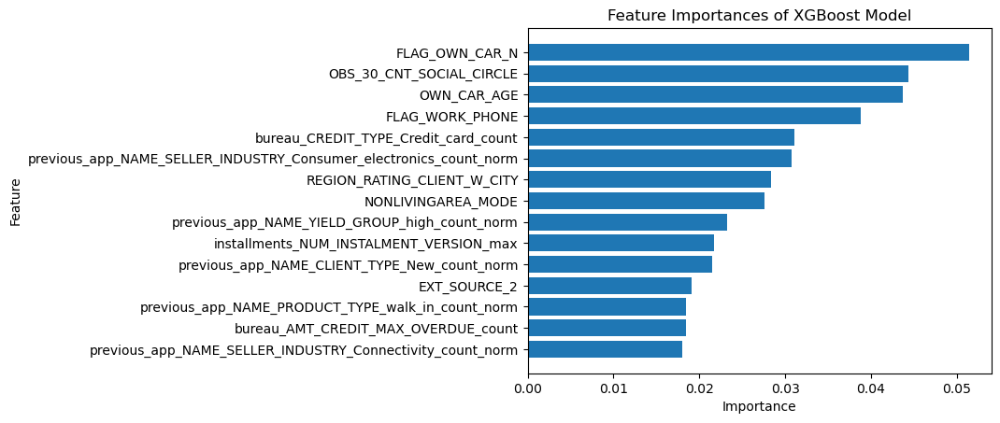

In [48]:
features_xgb_df = features_xgb_df.head(15)
plt.barh(features_xgb_df['Feature'], features_xgb_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances of XGBoost Model')
plt.gca().invert_yaxis()  #To display the most important feature at the top
plt.show()

### Insights from Feature Importance Analysis

The feature importance analysis provides several key insights:

1. **FLAG_OWN_CAR_N**:
   - This feature, indicating whether the applicant does not own a car, is the most important. It suggests that not owning a car is a significant factor in predicting loan repayment.
   
2. **OBS_30_CNT_SOCIAL_CIRCLE**:
   - The number of social circle observations in the last 30 days is highly important, suggesting that applicants' social activity levels are indicative of their repayment behavior.

3. **OWN_CAR_AGE**:
   - The age of the applicant's car is another important feature. Older cars might correlate with financial stability or the need for loan refinancing.

4. **FLAG_WORK_PHONE**:
   - Whether the applicant has a work phone is significant, possibly indicating stable employment.

5. **bureau_CREDIT_TYPE_Credit_card_count**:
   - The number of credit card counts from the bureau data is important, indicating the applicant's credit card usage history is a crucial factor.

6. **previous_app_NAME_SELLER_INDUSTRY_Consumer_elec**:
   - The industry of the seller in previous applications, particularly consumer electronics, is important, possibly reflecting spending patterns or financial commitments.

7. **REGION_RATING_CLIENT_W_CITY**:
   - The rating of the client’s region with the city is significant, suggesting that geographical location and associated socioeconomic factors play a role in repayment behavior.

8. **NONLIVINGAREA_MODE**:
   - The mode of non-living area space is relevant, indicating the size of non-residential property associated with the applicant may affect their financial situation.

9. **previous_app_NAME_YIELD_GROUP_high_count_norm**:
   - High yield group counts from previous applications are important, indicating high-risk financial products might be predictive of repayment behavior.

10. **installments_NUM_INSTALMENT_VERSION_max**:
    - The maximum number of installment versions is significant, suggesting the complexity of repayment plans affects repayment capability.

11. **previous_app_NAME_CLIENT_TYPE_New_count_norm**:
    - The count of new client types in previous applications is important, indicating new borrowers might have distinct repayment behaviors.

12. **EXT_SOURCE_2**:
    - An external source score is a significant predictor, reflecting the influence of external credit scoring.

13. **previous_app_NAME_PRODUCT_TYPE_walk_in_count_norm**:
    - Walk-in product type counts from previous applications are important, indicating the type of product applied for affects repayment.

14. **bureau_AMT_CREDIT_MAX_OVERDUE_count**:
    - The count of maximum overdue amounts from the bureau data is crucial, highlighting past overdue behavior as a key factor.

15. **previous_app_NAME_SELLER_INDUSTRY_Connectivity**:
    - The connectivity industry from previous applications is relevant, possibly reflecting applicants' financial behavior in tech-related purchases.

These insights help us understand the factors influencing loan repayment, guiding further analysis and model improvements.

# X. Plotting the ROC Curve and Calculating AUC Score

To evaluate the performance of our XGBoost model, we plot the ROC (Receiver Operating Characteristic) curve and calculate the AUC (Area Under the Curve) score. Here are the steps we followed:

### a. Predicting Probabilities on the Test Data
We use the trained XGBoost model to predict the probabilities of the positive class for the test data.

### b. Calculating ROC Curve and AUC Score
- We calculate the false positive rate (FPR) and true positive rate (TPR) at various threshold settings to plot the ROC curve.
- We also calculate the AUC score, which summarizes the ROC curve into a single value representing the model's ability to distinguish between the positive and negative classes.

### c. Plotting the ROC Curve
- We plot the ROC curve using Matplotlib, displaying the true positive rate against the false positive rate.
- The diagonal red line represents a model with no discriminative ability (AUC = 0.50). Our model's ROC curve is plotted in blue.

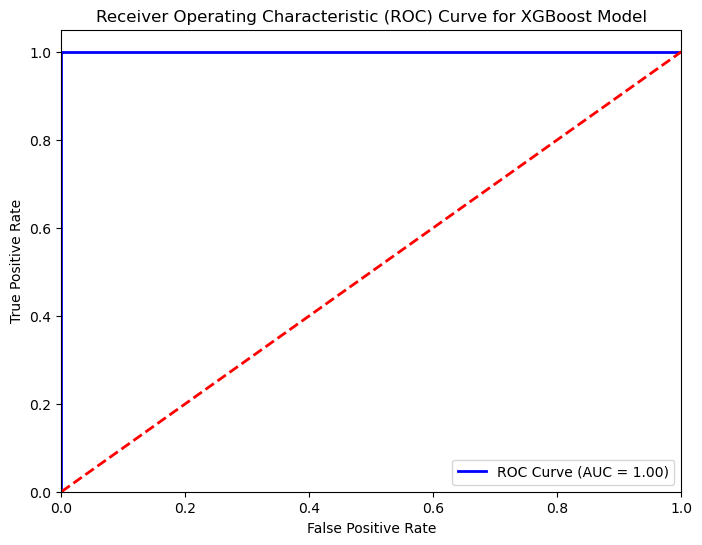

In [53]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Assuming X_test_reduced and y_test_actual are your actual test data and labels
# Predicting probabilities on the test data
y_test_probs_xgb = xgb_model.predict_proba(X_test_reduced)[:, 1]

# Calculating ROC curve and AUC
fpr_xgb, tpr_xgb, thresholds_xgb = roc_curve(y_test_pred, y_test_probs_xgb)
auc_score_xgb = roc_auc_score(y_test_pred, y_test_probs_xgb)

# Plotting ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_xgb, tpr_xgb, color='blue', lw=2, label='ROC Curve (AUC = %0.2f)' % auc_score_xgb)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for XGBoost Model')
plt.legend(loc="lower right")
plt.show()

### Results
- The AUC score for the XGBoost model is 1.00, indicating perfect discrimination between the positive and negative classes. However, it's important to ensure that the model is not overfitting.

By plotting the ROC curve and calculating the AUC score, we can visually and quantitatively assess the model's performance in distinguishing between loan repayment and default cases